In [223]:
import pandas as pd
import numpy as np
import librosa
import cv2
import os
import glob
from tqdm import tqdm
import IPython.display
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.io as pio
init_notebook_mode(connected=True)
pio.renderers.default = "notebook_connected"
import warnings
warnings.simplefilter("ignore")

s_path = "../../sounds/"

In [224]:
o_path = list(set(glob.glob(f'{s_path}*/*/*')))
path_ls = [file[3:] for file in o_path if file.endswith(".mp3") or file.endswith(".wav")]
name_ls = [name.split('/')[-1][:-4] for name in path_ls]
label_ls = [name.split('/')[-3] for name in path_ls]
info_df = pd.DataFrame()
info_df['path'] = path_ls
info_df['label'] = label_ls
info_df['name'] = name_ls
info_df

,path,label,name
0,../sounds/human/read_men/nVToV-zn_C4.0770.wav,human,nVToV-zn_C4.0770
1,../sounds/human/read_men/3LR5IpiEvSc.0442.wav,human,3LR5IpiEvSc.0442
2,../sounds/human/read_women/4_0714.wav,human,4_0714
3,../sounds/human/read_women/sub100121a00040.wav,human,sub100121a00040
4,../sounds/human/read_women/3_4085.wav,human,3_4085
...,...,...,...
22499,../sounds/human/read_women/3_1535.wav,human,3_1535
22500,../sounds/human/read_women/3_1785.wav,human,3_1785
22501,../sounds/animal/새 소리/Lophortyx_californica_V2...,animal,Lophortyx_californica_V2117_05_short
22502,../sounds/human/read_women/3_1404.wav,human,3_1404


In [225]:
result_df.groupby('cate1').count().sort_values('name')

,name,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,path,noise,cate2
cate1,,,,,,,,,,,,,,,,,,,,,
nature,216,216,216,216,216,216,216,216,216,216,...,216,216,216,216,216,216,216,216,216,216
human,925,925,925,925,925,925,925,925,925,925,...,925,925,925,925,925,925,925,925,0,925
life,1219,1219,1219,1219,1219,1219,1219,1219,1219,1219,...,1219,1219,1219,1219,1219,1219,1219,1219,0,1219
animal,1282,1282,1282,1282,1282,1282,1282,1282,1282,1282,...,1282,1282,1282,1282,1282,1282,1282,1282,277,1282
human_voice,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,...,2000,2000,2000,2000,2000,2000,2000,2000,37,2000


In [156]:
import cosine_similarity as cs
import freq_dataset as fd
cos = cs.CosineSimilarity()
freq = fd.MakeFreqDataset()

In [227]:
result_df = pd.read_csv("../files/freq_final_dataset.csv", encoding='utf-8-sig')
result_df.drop(["Unnamed: 0", "label"], axis=1, inplace=True)
result_df['path'] = [p.replace('original/clean', 'original_clean') for p in result_df['path']]
result_df['path'] = [p.replace('original/noise', 'original_noise') for p in result_df['path']]
path_ls = result_df['path']
result_df['path'] = [p.replace('human/read_women', 'human_voice/read_women') for p in result_df['path']]
result_df['path'] = [p.replace('human/read_men', 'human_voice/read_men') for p in result_df['path']]
result_df['path'] = [p.replace('human/영어리딩', 'human_voice/영어리딩') for p in result_df['path']]
result_df['path'] = [p.replace('human/original_noise', 'human_voice/original_noise') for p in result_df['path']]
result_df['path'] = [p.replace('human/original_clean', 'human_voice/original_clean') for p in result_df['path']]
result_df['cate1'] = [p.split('/')[-3] for p in result_df['path']]
result_df['cate2'] = [p.split('/')[-1][:3] if p.split('/')[-2] == 'cats_dogs' else p.split('/')[-2] for p in result_df['path']]
result_df['path'] = path_ls
result_df

,name,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,path,noise,cate1,cate2
0,cat_119,0.284324,0.080283,0.116524,0.035035,1061.271547,1.547536e+05,1329.783998,44388.201164,2001.603846,...,4.567149,42.138844,5.225847,39.697083,5.260680,33.465557,../sounds/animal/cats_dogs/cat_119.wav,clean,animal,cat
1,dog_barking_100,0.426439,0.109916,0.032564,0.004489,1626.752143,1.490662e+05,1644.495521,70639.091223,3268.740234,...,-2.927268,36.275764,-2.387175,70.726715,3.296551,93.897987,../sounds/animal/cats_dogs/dog_barking_100.wav,clean,animal,dog
2,cat_54,0.203641,0.089293,0.181991,0.005883,2344.144335,3.235486e+05,1503.098172,33353.104390,3627.886573,...,-15.044617,70.673302,17.618805,178.355392,0.816697,176.787277,../sounds/animal/cats_dogs/cat_54.wav,clean,animal,cat
3,cat_15,0.404880,0.133895,0.097528,0.006318,1510.993042,3.345212e+05,1674.112362,258817.119037,3113.328156,...,-11.319686,175.291428,5.300216,83.345917,6.450485,57.837170,../sounds/animal/cats_dogs/cat_15.wav,clean,animal,cat
4,cat_30,0.404268,0.094998,0.072871,0.005941,1547.687106,4.278606e+04,1453.063485,79612.852737,2804.668469,...,0.615722,52.483185,0.625472,51.724159,3.752055,45.712337,../sounds/animal/cats_dogs/cat_30.wav,clean,animal,cat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22499,UO62_2_3_0_19_0_0_0,0.596687,0.063218,0.017606,0.000238,3012.822673,1.413769e+06,2055.704305,183494.121478,5502.331543,...,-6.017879,61.895054,4.017175,53.293667,-3.685825,27.531643,../sounds/human_voice/read_women/4_2835.wav,NaN,human_voice,read_women
22500,jYYHDnEnnDY.0532,0.480263,0.101976,0.073356,0.005532,1546.017759,5.349460e+05,2091.387153,480797.826176,3599.353096,...,-1.969828,53.615490,-2.828741,37.364723,0.695443,44.442627,../sounds/human_voice/read_men/3LR5IpiEvSc.105...,NaN,human_voice,read_men
22501,QHOC_5_9_0_23_0_0_0,0.562584,0.066113,0.016748,0.000298,1873.343338,5.913499e+05,1825.989854,68530.194293,3769.387207,...,-4.128263,39.740143,1.627433,28.773853,-3.702916,46.514179,../sounds/human_voice/read_men/nVToV-zn_C4.067...,NaN,human_voice,read_men
22502,4_2566,0.341139,0.119525,0.062649,0.002389,1882.043797,1.079272e+06,2124.615936,461103.723759,3737.829425,...,-5.048860,128.742050,-1.848811,201.917435,1.630757,307.923187,../sounds/human_voice/read_women/3_4288.wav,NaN,human_voice,read_women


In [189]:
result_df[result_df['cate1']=='human_voice'].groupby('cate2').count()

,name,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,path,noise,cate1
cate2,,,,,,,,,,,,,,,,,,,,,
original_clean,163,163,163,163,163,163,163,163,163,163,...,163,163,163,163,163,163,163,163,163,163
original_noise,168,168,168,168,168,168,168,168,168,168,...,168,168,168,168,168,168,168,168,168,168
read_men,3808,3808,3808,3808,3808,3808,3808,3808,3808,3808,...,3808,3808,3808,3808,3808,3808,3808,3808,0,3808
read_women,13659,13659,13659,13659,13659,13659,13659,13659,13659,13659,...,13659,13659,13659,13659,13659,13659,13659,13659,0,13659
영어리딩,236,236,236,236,236,236,236,236,236,236,...,236,236,236,236,236,236,236,236,236,236


In [194]:
voice_random[voice_random['cate1']=='human_voice'].groupby('cate2').count()

,name,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,path,noise,cate1
cate2,,,,,,,,,,,,,,,,,,,,,
original_clean,24,24,24,24,24,24,24,24,24,24,...,24,24,24,24,24,24,24,24,24,24
original_noise,13,13,13,13,13,13,13,13,13,13,...,13,13,13,13,13,13,13,13,13,13
read_men,420,420,420,420,420,420,420,420,420,420,...,420,420,420,420,420,420,420,420,0,420
read_women,1543,1543,1543,1543,1543,1543,1543,1543,1543,1543,...,1543,1543,1543,1543,1543,1543,1543,1543,0,1543


In [193]:
### random samping으로 라벨별 개수 맞추기
voice_random = result_df[result_df['cate1']=='human_voice'].copy()
voice_random.drop(result_df[result_df['cate2']=='영어리딩'].index, axis=0, inplace=True)
voice_random = voice_random.sample(n=2000, random_state=13)
voice_random

,name,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,path,noise,cate1,cate2
4871,3_0943,0.398092,0.121407,0.048603,0.002350,2458.663757,1.959853e+06,2360.933687,503012.703999,4837.213108,...,-2.782783,42.772923,-5.716895,81.313950,-1.356016,99.803284,../sounds/human_voice/read_women/3_2590.wav,NaN,human_voice,read_women
4193,2_0890,0.385187,0.120121,0.082048,0.006082,1917.208844,1.051899e+06,2225.103000,352671.910569,3812.611341,...,3.375547,221.844101,-0.315273,273.854309,5.974663,311.937531,../sounds/human_voice/read_men/nVToV-zn_C4.063...,NaN,human_voice,read_men
5290,ANLG_14_2_0_20_0_0_0,0.498214,0.094492,0.011003,0.000555,2647.421160,1.655982e+06,1862.015200,192760.888573,4435.938620,...,-7.886872,81.395393,-1.771095,28.133608,-3.330106,75.122719,../sounds/human_voice/read_men/jYYHDnEnnDY.027...,NaN,human_voice,read_men
21553,4_2604,0.344436,0.116649,0.075870,0.004226,1970.573335,1.186680e+06,2274.167122,373119.725754,4040.434347,...,0.276054,222.810974,3.260017,275.479126,6.590019,363.895233,../sounds/human_voice/read_women/3_3230.wav,NaN,human_voice,read_women
8794,4_2673,0.352995,0.116831,0.054735,0.002371,1862.115471,1.123236e+06,2061.588958,502016.437495,3639.296959,...,-12.051355,104.509071,-8.818413,60.404724,-5.007263,45.266125,../sounds/human_voice/read_women/3_1106.wav,NaN,human_voice,read_women
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5800,4_0581,0.385682,0.111791,0.052275,0.002457,2072.916072,9.693131e+05,2201.107450,383956.222215,4110.801068,...,3.475724,205.481613,-1.225235,257.176178,7.658126,221.549530,../sounds/human_voice/read_women/3_0128.wav,NaN,human_voice,read_women
8628,3_3639,0.405367,0.118553,0.064141,0.004196,1888.066221,1.231396e+06,2060.303008,550744.138736,3675.602711,...,1.772431,346.839539,-1.575722,176.075851,1.492135,200.528305,../sounds/human_voice/read_women/3_0761.wav,NaN,human_voice,read_women
6223,4_5608,0.404408,0.123193,0.061266,0.003240,2568.093885,2.083079e+06,2373.577114,521192.560288,4856.093815,...,0.952207,275.624756,2.960339,226.836685,5.076541,295.504669,../sounds/human_voice/read_women/4_4230.wav,NaN,human_voice,read_women
8050,2_0889,0.346681,0.114354,0.079727,0.004474,1895.138307,1.068889e+06,2073.998423,608951.348503,3865.051629,...,-9.379026,109.631111,-7.051338,52.180206,-4.149565,50.533474,../sounds/human_voice/read_men/3LR5IpiEvSc.037...,NaN,human_voice,read_men


In [195]:
result_df = result_df.drop(result_df[result_df['cate1']=='human_voice'].index, axis=0)
result_df = result_df.drop(result_df[result_df['cate2']=='cats_dog_add_noise'].index, axis=0)
result_df = pd.concat([result_df, voice_random])

In [196]:
result_df.groupby('cate1').count().sort_values('name')

,name,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,path,noise,cate2
cate1,,,,,,,,,,,,,,,,,,,,,
nature,216,216,216,216,216,216,216,216,216,216,...,216,216,216,216,216,216,216,216,216,216
human,925,925,925,925,925,925,925,925,925,925,...,925,925,925,925,925,925,925,925,0,925
life,1219,1219,1219,1219,1219,1219,1219,1219,1219,1219,...,1219,1219,1219,1219,1219,1219,1219,1219,0,1219
animal,1282,1282,1282,1282,1282,1282,1282,1282,1282,1282,...,1282,1282,1282,1282,1282,1282,1282,1282,277,1282
human_voice,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,...,2000,2000,2000,2000,2000,2000,2000,2000,37,2000


In [184]:
count_df = result_df[['cate1', 'cate2','path']].groupby(['cate1', 'cate2']).count()
count_df = count_df.reset_index()
count_df[count_df['cate1']=='human_voice'].sort_values(by='path', ascending=False)

,cate1,cate2,path
36,human_voice,original_clean,163
37,human_voice,original_noise,163
38,human_voice,read_men,163
39,human_voice,read_women,163
40,human_voice,영어리딩,163


In [153]:
tmp_df = result_df.drop(['name', 'path', 'noise', 'cate2'], axis=1)
tmp_df.groupby(['cate1']).mean()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
cate1,,,,,,,,,,,,,,,,,,,,,
animal,0.382316,0.099609,0.073530,0.004086,1666.187631,6.421038e+05,1687.695714,230283.967714,3211.173737,2.524552e+06,...,-3.907747,90.727292,0.677541,89.345051,-1.802765,106.174510,-0.522450,110.490895,1.114254,124.879298
human,0.400187,0.109281,0.062208,0.003775,2041.551571,1.153770e+06,2111.577316,435385.349373,4058.768204,4.619351e+06,...,-2.955604,85.640362,-0.546343,94.770195,-1.289816,136.345021,-1.226039,137.055026,3.100816,166.133673
human_voice,0.368366,0.104007,0.068749,0.003611,1875.244578,1.112850e+06,1987.815212,464037.075024,3679.079236,4.395141e+06,...,-2.601475,70.631609,-2.876393,70.198136,-1.487040,83.957501,-2.914946,87.853792,0.121018,98.365096
life,0.407256,0.108242,0.063424,0.003730,2070.770346,1.119959e+06,2144.289869,411640.395559,4127.242043,4.524784e+06,...,-2.755626,88.465244,-0.418448,97.497410,-1.118860,135.469100,-1.230712,140.767256,3.022383,165.735972
nature,0.559353,0.060110,0.068749,0.002420,2632.020838,1.941603e+05,2088.877403,102033.395547,4735.111962,7.448991e+05,...,-1.191501,21.908848,-0.463164,20.680098,-1.070060,21.029369,-1.618563,21.766757,1.090146,20.124232


In [154]:
for c in tmp_df.columns.tolist():
    fig = px.box(tmp_df, x='cate1', y=c)
    fig.show()

In [157]:
tmp_df = result_df.set_index('cate1', drop=True)
tmp_df = tmp_df.drop(['name', 'path', 'noise', 'cate2'], axis=1)
cos_df = cos.make_cos_df(tmp_df)
cos_df

shape:  (5285, 5285)


cate1,animal,animal,animal,animal,animal,animal,animal,animal,animal,animal,...,human_voice,human_voice,human_voice,human_voice,human_voice,human_voice,human_voice,human_voice,human_voice,human_voice
cate1,,,,,,,,,,,,,,,,,,,,,
animal,1.000000,0.227116,0.115952,0.079445,0.470006,0.454153,0.474206,0.062763,0.191107,0.107849,...,-0.131777,-0.247613,-0.216162,-0.227993,-0.235826,-0.145300,-0.089763,-0.223277,-0.003531,0.166281
animal,0.227116,1.000000,-0.015805,0.019650,0.279857,0.099964,0.123069,0.442262,0.195243,0.381066,...,0.102994,-0.289352,-0.096171,-0.164693,-0.138162,-0.037683,-0.155103,-0.084775,-0.077000,-0.101291
animal,0.115952,-0.015805,1.000000,0.175447,0.249323,-0.089151,-0.215321,-0.044055,0.426504,0.211813,...,-0.345956,-0.289271,-0.229097,-0.248629,-0.174196,-0.423107,-0.273239,-0.061214,-0.112321,-0.110953
animal,0.079445,0.019650,0.175447,1.000000,0.332426,0.269587,0.111879,0.078045,0.228042,0.055543,...,-0.174612,-0.205757,-0.393065,-0.205224,-0.130965,-0.154514,-0.185286,-0.188149,-0.301314,-0.204446
animal,0.470006,0.279857,0.249323,0.332426,1.000000,0.512414,0.596231,0.322680,0.197234,0.165753,...,-0.194169,-0.283268,-0.433520,-0.452260,-0.232497,-0.275685,-0.336850,-0.363293,-0.340794,-0.165836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
human_voice,-0.145300,-0.037683,-0.423107,-0.154514,-0.275685,0.087555,0.183989,0.046506,-0.531723,-0.304504,...,0.567132,0.716258,0.331587,0.555929,0.678744,1.000000,0.761645,0.394356,0.533736,0.245617
human_voice,-0.089763,-0.155103,-0.273239,-0.185286,-0.336850,-0.122675,-0.001544,-0.168230,-0.313259,-0.303844,...,0.503142,0.787174,0.410419,0.618610,0.670206,0.761645,1.000000,0.332603,0.592790,0.235344
human_voice,-0.223277,-0.084775,-0.061214,-0.188149,-0.363293,-0.070005,-0.208391,0.023031,-0.259797,-0.035197,...,0.298612,0.455182,0.510586,0.448418,0.319485,0.394356,0.332603,1.000000,0.486508,0.266364


In [158]:
final_df = pd.DataFrame()
s1, s2, cos = [], [], []
for x in tqdm(range(len(cos_df.index))):
    for y in range(len(cos_df.index)):
        s1.append(cos_df.columns[x])
        s2.append(cos_df.columns[y])
        cos.append(cos_df.iloc[x, y])
final_df['track1'] = s1
final_df['track2'] = s2
final_df['similarity'] = cos
# final_df = final_df.drop(final_df[final_df['track1'] == final_df['track2']].index)
final_df

100%|██████████| 5285/5285 [21:29<00:00,  4.10it/s]


,track1,track2,similarity
0,animal,animal,1.000000
1,animal,animal,0.227116
2,animal,animal,0.115952
3,animal,animal,0.079445
4,animal,animal,0.470006
...,...,...,...
27931220,human_voice,human_voice,0.245617
27931221,human_voice,human_voice,0.235344
27931222,human_voice,human_voice,0.266364
27931223,human_voice,human_voice,0.535835


In [159]:
final_df.groupby('track1').count()

,track2,similarity
track1,,
animal,11151350,11151350
human,4888625,4888625
human_voice,4307275,4307275
life,6442415,6442415
nature,1141560,1141560


In [160]:
def overlook(category):
    print(category,"코사인유사도 분포")
    sns.boxplot(data=final_df[final_df['track1']==category], x= 'track2', y='similarity');
    return final_df[final_df['track1']==category].groupby('track2').describe()

animal 코사인유사도 분포


similarity                                                    \
                 count      mean       std       min       25%       50%   
track2                                                                     
animal       4452100.0  0.018576  0.347581 -0.851360 -0.252448 -0.007025   
human        1951750.0 -0.036171  0.340944 -0.831994 -0.293916 -0.091077   
human_voice  1719650.0 -0.020433  0.278575 -0.801196 -0.219090 -0.044718   
life         2572090.0 -0.035332  0.343284 -0.846506 -0.294627 -0.090829   
nature        455760.0  0.008495  0.305334 -0.766455 -0.221802 -0.009724   

                            
                  75%  max  
track2                      
animal       0.274660  1.0  
human        0.186430  1.0  
human_voice  0.157615  1.0  
life         0.189303  1.0  
nature       0.221701  1.0

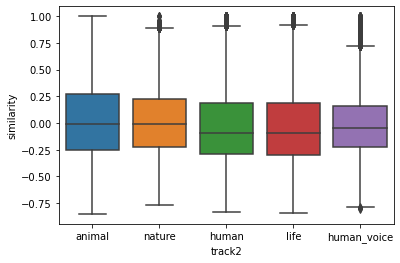

In [161]:
overlook('animal')

human 코사인유사도 분포


similarity                                                    \
                 count      mean       std       min       25%       50%   
track2                                                                     
animal       1951750.0 -0.036171  0.340944 -0.831994 -0.293916 -0.091077   
human         855625.0  0.140350  0.339201 -0.753806 -0.141281  0.108445   
human_voice   753875.0  0.030124  0.290064 -0.764743 -0.182408 -0.005285   
life         1127575.0  0.133915  0.343052 -0.805521 -0.149424  0.095777   
nature        199800.0 -0.153771  0.267093 -0.786258 -0.349354 -0.190137   

                            
                  75%  max  
track2                      
animal       0.186430  1.0  
human        0.434921  1.0  
human_voice  0.219972  1.0  
life         0.434325  1.0  
nature      -0.002175  1.0

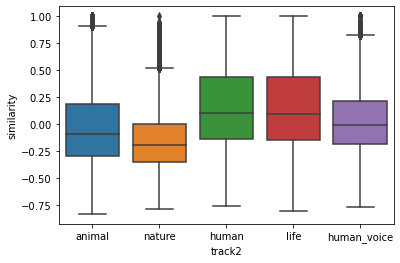

In [162]:
overlook('human')

human_voice 코사인유사도 분포


similarity                                                    \
                 count      mean       std       min       25%       50%   
track2                                                                     
animal       1719650.0 -0.020433  0.278575 -0.801196 -0.219090 -0.044718   
human         753875.0  0.030124  0.290064 -0.764743 -0.182408 -0.005285   
human_voice   664225.0  0.063451  0.275354 -0.720411 -0.136824  0.039305   
life          993485.0  0.026855  0.291108 -0.769630 -0.184969 -0.010292   
nature        176040.0 -0.010190  0.272509 -0.745153 -0.205478 -0.032459   

                                 
                  75%       max  
track2                           
animal       0.157615  1.000000  
human        0.219972  1.000000  
human_voice  0.247815  1.000000  
life         0.215291  1.000000  
nature       0.165716  0.946457

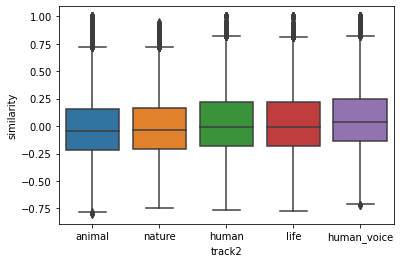

In [163]:
overlook('human_voice')

nature 코사인유사도 분포


similarity                                                    \
                 count      mean       std       min       25%       50%   
track2                                                                     
animal        455760.0  0.008495  0.305334 -0.766455 -0.221802 -0.009724   
human         199800.0 -0.153771  0.267093 -0.786258 -0.349354 -0.190137   
human_voice   176040.0 -0.010190  0.272509 -0.745153 -0.205478 -0.032459   
life          263304.0 -0.142174  0.283661 -0.753917 -0.348631 -0.189079   
nature         46656.0  0.399605  0.316220 -0.543123  0.174056  0.386216   

                                 
                  75%       max  
track2                           
animal       0.221701  1.000000  
human       -0.002175  1.000000  
human_voice  0.165716  0.946457  
life         0.012521  1.000000  
nature       0.641624  1.000000

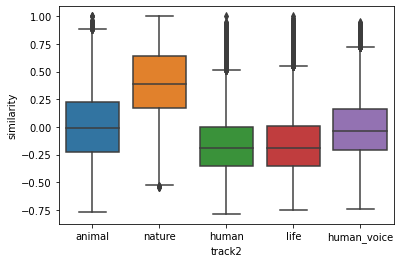

In [164]:
overlook('nature')

life 코사인유사도 분포


similarity                                                    \
                 count      mean       std       min       25%       50%   
track2                                                                     
animal       2572090.0 -0.035332  0.343284 -0.846506 -0.294627 -0.090829   
human        1127575.0  0.133915  0.343052 -0.805521 -0.149424  0.095777   
human_voice   993485.0  0.026855  0.291108 -0.769630 -0.184969 -0.010292   
life         1485961.0  0.128988  0.348813 -0.775797 -0.157390  0.083829   
nature        263304.0 -0.142174  0.283661 -0.753917 -0.348631 -0.189079   

                            
                  75%  max  
track2                      
animal       0.189303  1.0  
human        0.434325  1.0  
human_voice  0.215291  1.0  
life         0.435860  1.0  
nature       0.012521  1.0

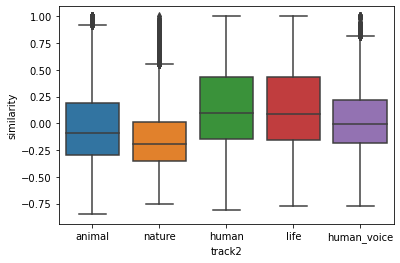

In [165]:
overlook('life')

---
# HDBSCAN

In [197]:
import hdbscan
from sklearn.manifold import TSNE
import seaborn as sns

In [198]:
tsne = TSNE()
tmp_df = result_df.set_index('path', drop=True)
tmp_df = tmp_df.drop(['name', 'cate1', 'cate2', 'noise'], axis=1)
tsne_fit = tsne.fit_transform(tmp_df)
tsne_df = pd.DataFrame(tsne_fit, index=tmp_df.index, columns=['x', 'y'])

[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46
 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61]


,x,y,hdbscan,cate1,cate2
path,,,,,
../sounds/animal/cats_dogs/cat_119.wav,-33.183147,-58.765739,0,animal,cat
../sounds/animal/cats_dogs/dog_barking_100.wav,-56.342136,-36.734592,0,animal,dog
../sounds/animal/cats_dogs/cat_54.wav,-54.060848,-30.936672,0,animal,cat
../sounds/animal/cats_dogs/cat_15.wav,-76.348412,-20.141148,0,animal,cat
../sounds/animal/cats_dogs/cat_30.wav,-35.649265,-65.226929,0,animal,cat
...,...,...,...,...,...
../sounds/human_voice/read_women/3_0128.wav,60.782829,7.481935,13,human_voice,read_women
../sounds/human_voice/read_women/3_0761.wav,-26.630684,-8.072239,59,human_voice,read_women
../sounds/human_voice/read_women/4_4230.wav,-25.987799,50.579823,36,human_voice,read_women


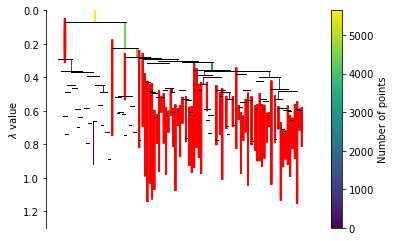

In [206]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=25, min_samples=1, gen_min_span_tree=True,prediction_data=True)
clusterer.fit(tsne_df)
# 예측 데이터 생성
pred_hds = clusterer.fit_predict(tsne_df)
print(np.unique(pred_hds))
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())
hdbscan_df = tsne_df.copy()
hdbscan_df['hdbscan'] = pred_hds
hdbscan_df['cate1'] = result_df['cate1'].tolist()
hdbscan_df['cate2'] = result_df['cate2'].tolist()
hdbscan_df

In [207]:
hdbscan_df.groupby(['cate1', 'cate2', 'hdbscan']).count()

x    y
cate1  cate2 hdbscan          
animal cat   -1         3    3
              0       148  148
              1         1    1
              2         9    9
              25        1    1
...                   ...  ...
nature 천둥 소리  50        1    1
       풍경 소리 -1         1    1
              0        77   77
              2         2    2
              29        1    1

[1749 rows x 2 columns]

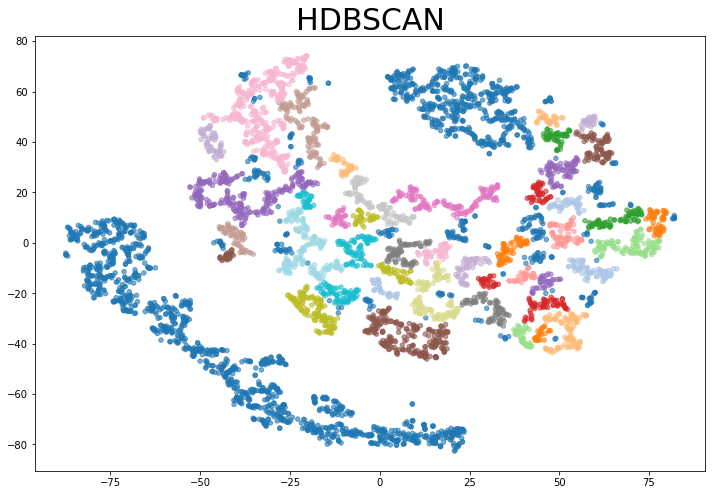

In [208]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.scatter(hdbscan_df['x'], hdbscan_df['y'], c=hdbscan_df["hdbscan"].tolist(), s=20, cmap="tab20", alpha=0.6)
ax.set_title("HDBSCAN", fontsize=30)
fig.show()

In [209]:
px.scatter(hdbscan_df, x='x', y='y',color='cate1', hover_name='hdbscan')

-----

In [303]:
hdbscan_df.groupby(['label', 'hdbscan']).count()

x    y
label  hdbscan          
cat    -1         1    1
        0        34   34
        1        83   83
        2       523  523
        3         2    2
        4         3    3
        5         3    3
        6         4    4
dog     0         3    3
        1        15   15
        2       433  433
        4         1    1
human  -1         9    9
        0       149  149
        1        70   70
        2        43   43
        3       125  125
        4        48   48
        5        31   31
        6        92   92
nature  0         9    9
        1        27   27
        2       175  175
        4         2    2
        5         1    1
        6         2    2

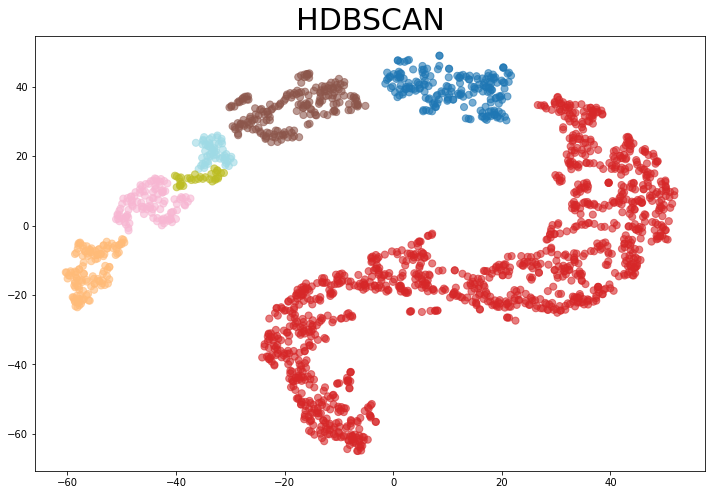

In [314]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.scatter(hdbscan_df['x'], hdbscan_df['y'], c=hdbscan_df["hdbscan"].tolist(), s=50, cmap="tab20", alpha=0.6)
ax.set_title("HDBSCAN", fontsize=30)
fig.show()

In [315]:
px.scatter(hdbscan_df, x='x', y='y',color='label', hover_name='hdbscan')

In [179]:
tmp = hdbscan_df[hdbscan_df['cate1']=='human_voice'].sort_values('x')
tmp['tag'] = [p.split('/')[-2] for p in tmp.index]
tmp['name'] = [p.split('/')[-1][:-4] for p in tmp.index]
px.scatter(tmp, x='x', y='y',color='tag', hover_name='name')

In [181]:
tmp = hdbscan_df[hdbscan_df['cate1']=='animal'].sort_values('x')
tmp['tag'] = [p.split('/')[-2] for p in tmp.index]
tmp['name'] = [p.split('/')[-1][:-4] for p in tmp.index]
px.scatter(tmp, x='x', y='y',color='tag', hover_name='name')

---

In [300]:
!pip install imblearn

     |████████████████████████████████| 189 kB 16.2 MB/s eta 0:00:01


In [304]:
y.reset_index().groupby('cate1').count()

,index
cate1,
animal,2110
human,925
human_voice,18034
life,1219
nature,216


# 분류

In [355]:
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, RepeatedStratifiedKFold
cross_val_score 
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, plot_confusion_matrix, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
import pickle
import joblib
import seaborn as sns

In [26]:
def play_song(path):
    (file_dir, file_id) = os.path.split(path)
    print(file_id[:-4])
    print(IPython.display.display(IPython.display.Audio(path)))
def play_song_ls(cm_lr_df):
    for idx, path in enumerate(cm_lr_df['path']):
        print(cm_lr_df['pred'].iloc[idx])
        play_song(path)

In [356]:
def model_fit_kfold(model):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cf = confusion_matrix(y_test, y_pred)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=13)
#     re_kfold = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    print("accuracy:", round(accuracy_score(y_test, y_pred),6))
    print("recall:", round(recall_score(y_test, y_pred, labels=np.unique(y), average='macro'),6))
    print("f1 score:", round(f1_score(y_test, y_pred, labels=np.unique(y), average='macro'),6))
    print("Cross Validation Score:", cross_val_score(model, X, y, cv=kfold))
    sns.heatmap(cf, annot=True, xticklabels=np.unique(y), yticklabels=np.unique(y), fmt="d", cmap="Blues")
    
    return model, y_pred

In [87]:
def check_false_pred(y_pred):
    cm_lr_df = pd.DataFrame()
    cm_lr_df['answer'] = y_test
    cm_lr_df['pred'] = y_pred
    cm_lr_df['result'] = y_test == y_pred
    cm_lr_df['path'] = X_test.index
    cm_lr_df['cate1'] = [result_df[result_df['path']== p]['cate1'].iloc[0] for p in cm_lr_df['path']]
#     cm_lr_df['noise'] = [result_df[result_df['path']== p]['noise'].iloc[0] for p in cm_lr_df['path']]
    cm_lr_df['name'] = [f"{p.split('/')[-2]}__{p.split('/')[-1][:-4]}" for p in cm_lr_df['path']]
#     [l.split('/')[-1]for l in cm_lr_df['path']]
    cm_lr_df = cm_lr_df[cm_lr_df['result']==False].sort_values(['answer', 'cate1','name'])
    return cm_lr_df

In [291]:
tmp_df = result_df.set_index('path', drop=True)
tmp_df = tmp_df.drop(['name', 'cate1','cate2', 'noise'], axis=1)
X = tmp_df
# y = result_df['label']
y = ['human_voice' if label =='human_voice' else 'Not_human' for label in result_df['cate1']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=13, shuffle=True, stratify=y)

In [346]:
tmp_df = result_df.set_index('path', drop=True)
tmp_df = tmp_df.drop(['name', 'cate1', 'cate2', 'noise'], axis=1)
X = tmp_df
y = result_df['cate1']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=13, shuffle=True, stratify=y)
len(X_train), len(y_test)
y_test.reset_index().groupby('cate1').count()

In [349]:
tmp_df = result_df.set_index('path', drop=True)
tmp_df = tmp_df.drop(['name', 'cate1', 'cate2', 'noise'], axis=1)
X = tmp_df
y = result_df['cate1']
X, y = ADASYN(random_state=0).fit_resample(X, y) # oversamping
# X, y = RandomUnderSampler(random_state=0).fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13, shuffle=True, stratify=y)
print(len(y_train), len(y_test))
y_test.reset_index().groupby('cate1').count()

72592 18149


,index
cate1,
animal,3620
human,3628
human_voice,3607
life,3671
nature,3623


In [350]:
weights = {'animal': 9, 'human': 15, 'life': 13, 'nature': 20}

accuracy: 0.271585
recall: 0.271448
f1 score: 0.256474
Cross Validation Score: [0.35004683 0.31221071 0.26405114 0.30692087 0.27407979]


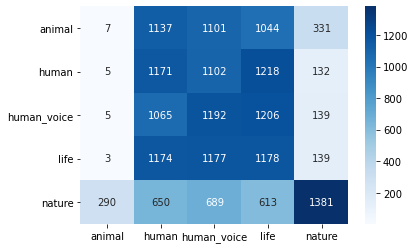

In [351]:
lr_y_pred = model_fit_kfold(LogisticRegression())
# cm_lr_df = check_false_pred(lr_y_pred)
# cm_lr_df

accuracy: 0.790347
recall: 0.79044
f1 score: 0.790195
Cross Validation Score: [0.79414844 0.79579017 0.79501873 0.79309015 0.79320035]


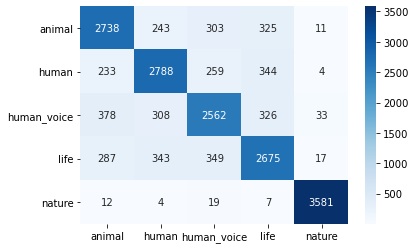

In [357]:
dt_model, dt_y_pred = model_fit_kfold(DecisionTreeClassifier())
# cm_dt_df = check_false_pred(dt_y_pred)
# cm_dt_df

In [359]:
joblib.dump(dt_model, 'models/DTC_79.pkl') 

['models/DTC_79.pkl']

accuracy: 0.803515
recall: 0.80383
f1 score: 0.799335
Cross Validation Score: [0.80329495 0.80278819 0.80113511 0.79716773 0.80477188]


['models/XGB_80.pkl']

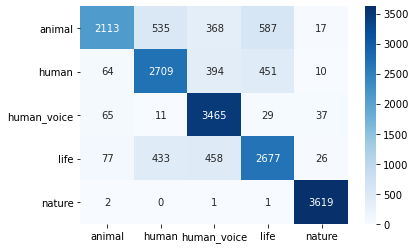

In [360]:
model, xgb_y_pred = model_fit_kfold(XGBClassifier(num_class=5,
                                           learning_rate=0.1,
                                           eval_metric='mlogloss'))
# cm_xgb_df = check_false_pred(xgb_y_pred)
# cm_xgb_df
joblib.dump(model, 'models/XGB_80.pkl') 

In [ ]:
rf_y_pred = model_fit_kfold(RandomForestClassifier(class_weight="balanced_subsample", n_estimators=10, random_state=13, oob_score=True))
# cm_rf_df = check_false_pred(rf_y_pred)
# cm_rf_df

accuracy: 0.867816
recall: 0.867739
f1 score: 0.866974
Cross Validation Score: [0.86946939 0.87227243 0.86907648 0.86962751 0.86852546]


['models/RF_85.pkl']

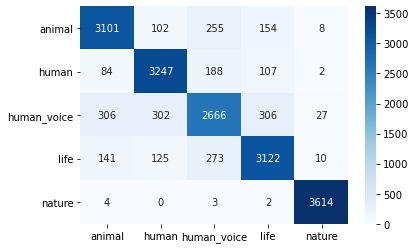

In [361]:
model, rf_y_pred = model_fit_kfold(RandomForestClassifier(n_estimators=10, random_state=13, oob_score=True))
# cm_rf_df = check_false_pred(rf_y_pred)
# cm_rf_df
joblib.dump(model, 'models/RF_85.pkl') 

In [75]:
np.unique(y)

array(['animal', 'human', 'human_voice', 'life', 'nature'], dtype=object)

In [22]:
play_song_ls(cm_rf_df)

dog
cat_109_0


None
dog
cat_129_0


None
dog
cat_129_1


None
dog
cat_60_2


None
human
cat_144


None
cat
dog_barking_100_1


None
cat
dog_barking_100_2


None
cat
dog_barking_109_1


None
cat
dog_barking_112_1


None
cat
dog_barking_22_0


None
cat
dog_barking_93_2


None
cat
dog_barking_104


None
human
dog_barking_6


None
cat
dog_barking_89


None
cat
4-159609-A-14


None
human
4-159609-B-14


None
cat
5-257839-A-14


None


## 이미지로 보는 분류 작업은 지속 예정

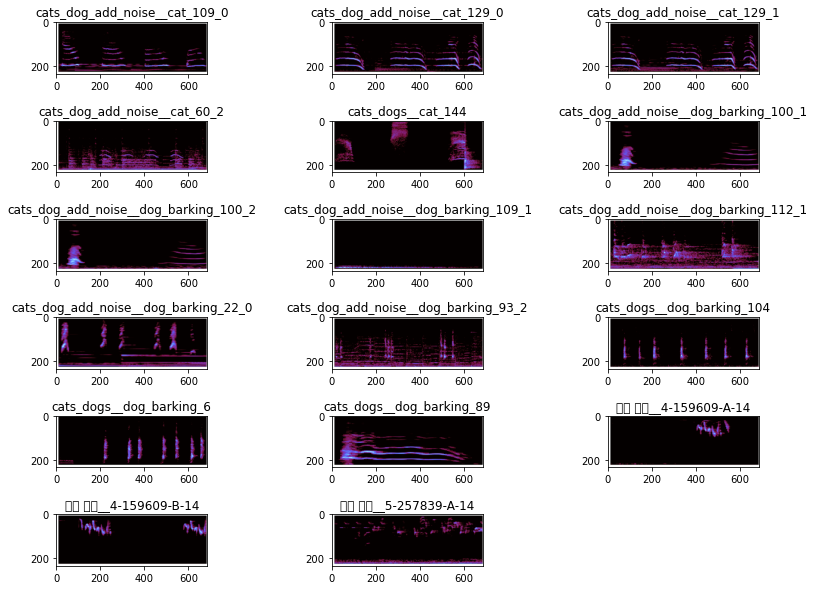

In [34]:
img_path = "../imgs"
plt.figure(figsize=(14,10))
for idx, name in enumerate(cm_rf_df['name'].tolist()):
    plt.subplot(6,3,idx+1)
    plt.imshow(cv2.imread(f"{img_path}/melspec/{name}.png"))
    plt.title(name)
plt.subplots_adjust(wspace=0.2, hspace=0.9)
plt.show()